## Motivation
Do the required analysis on the model trained in the previous step

In [1]:
import pandas as pd
import numpy as np
from wordcloud import WordCloud, STOPWORDS 
import urllib
import matplotlib.pyplot as plt 
from PIL import Image
import requests
from io import BytesIO
from random import sample 

%matplotlib inline

In [2]:
result = pd.read_csv("bundle_id_topic.csv")
print(result.shape)
with_icons = pd.read_parquet("/Users/PocketmathUser/Desktop/scraped_data/")
print(with_icons.shape)
result = result.merge(
    with_icons[["bundle_id", "icon_url","primary_genre"]], on="bundle_id", how="left")


(101775, 6)
(44520, 17)


/anaconda3/lib/python3.7/site-packages/pyarrow/pandas_compat.py:708: FutureWarning: .labels was deprecated in version 0.24.0. Use .codes instead.
  labels = getattr(columns, 'labels', None) or [
/anaconda3/lib/python3.7/site-packages/pyarrow/pandas_compat.py:735: FutureWarning: the 'labels' keyword is deprecated, use 'codes' instead
  return pd.MultiIndex(levels=new_levels, labels=labels, names=columns.names)
/anaconda3/lib/python3.7/site-packages/pyarrow/pandas_compat.py:752: FutureWarning: .labels was deprecated in version 0.24.0. Use .codes instead.
  labels, = index.labels


In [3]:
stopwords = set(STOPWORDS)

In [4]:
comment_words = ''
key_words=list(result.keywords)
for val in key_words:
    val=val.replace(",","")
    comment_words=comment_words+val+" "    

In [5]:
wordcloud = WordCloud(width = 1000, height = 800, 
                background_color ='white', collocations=False,
                stopwords = None, 
                min_font_size = 10).generate(comment_words) 

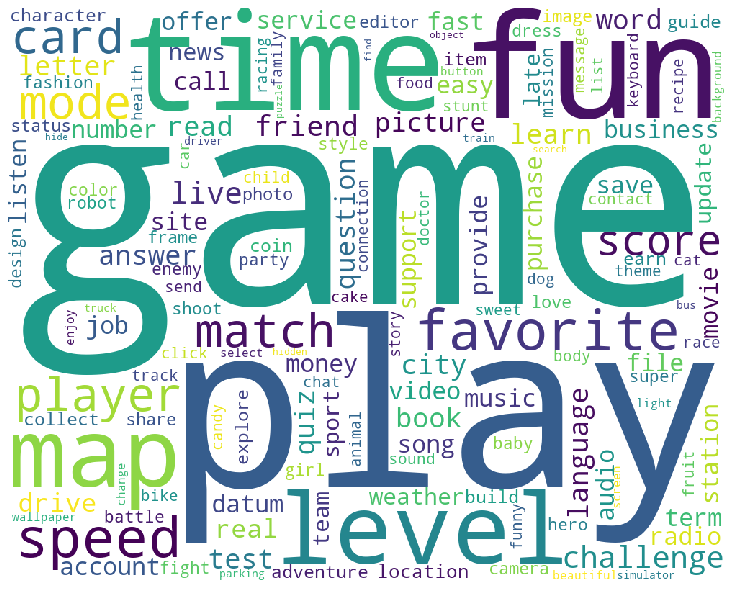

In [6]:
# plot the WordCloud image                        
plt.figure(figsize = (14, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

In [7]:
result.columns

Index(['bundle_id', 'topic_num', 'topic_perc_contrib', 'keywords',
       'lemmatized_desc', 'description', 'icon_url', 'primary_genre'],
      dtype='object')

### Get the icons for each of the generated topics

In [8]:
def plot_images(group):
    cols=3 
    rows=5
    key_word = list(group["keywords"].unique())[0]
    icon_url_list = list(group["icon_url"].unique())
    icon_urls = sample(icon_url_list,(rows*cols))
    
    fig, axes=plt.subplots(rows,cols,figsize=(15,18))
    
    index=0
    for row in range(rows):
        for col in range(cols):
            response = requests.get(icon_urls[index])
            img = Image.open(BytesIO(response.content))
            axes[row][col].imshow(img)
            axes[row][col].set_axis_off()
            index=index+1
    
    file_name=key_word.replace(","," ")
    plt.savefig(f"saved_model/icons/{file_name}.jpg", bbox_inches='tight')
    fig.suptitle(key_word)
    #fig.tight_layout()
       

In [9]:
def get_key_words(group):
    key_word = list(group["keywords"].unique())[0]
    return pd.Series({"keywords": key_word})

topics = result.groupby("topic_num").apply(get_key_words)
topics.reset_index(inplace=True)
pd.set_option('display.max_colwidth', -1)
topics

,topic_num,keywords
0,0,"theme, keyboard, message, click, list, chat, favorite, send, contact, connection"
1,1,"call, support, file, number, time, fast, easy, save, datum, speed"
2,2,"girl, design, dress, fun, play, color, baby, style, party, fashion"
3,3,"game, play, level, player, mode, fun, card, match, score, challenge"
4,4,"collect, character, map, build, earn, coin, item, adventure, explore, guide"
5,5,"animal, fun, sound, story, child, dog, cat, friend, family, funny"
6,6,"food, recipe, fruit, time, candy, body, sweet, doctor, health, cake"
7,7,"news, weather, live, late, sport, update, team, map, location, time"
8,8,"game, hero, city, robot, fight, battle, super, shoot, mission, enemy"
9,9,"game, drive, truck, simulator, parking, city, bus, real, driver, train"


""


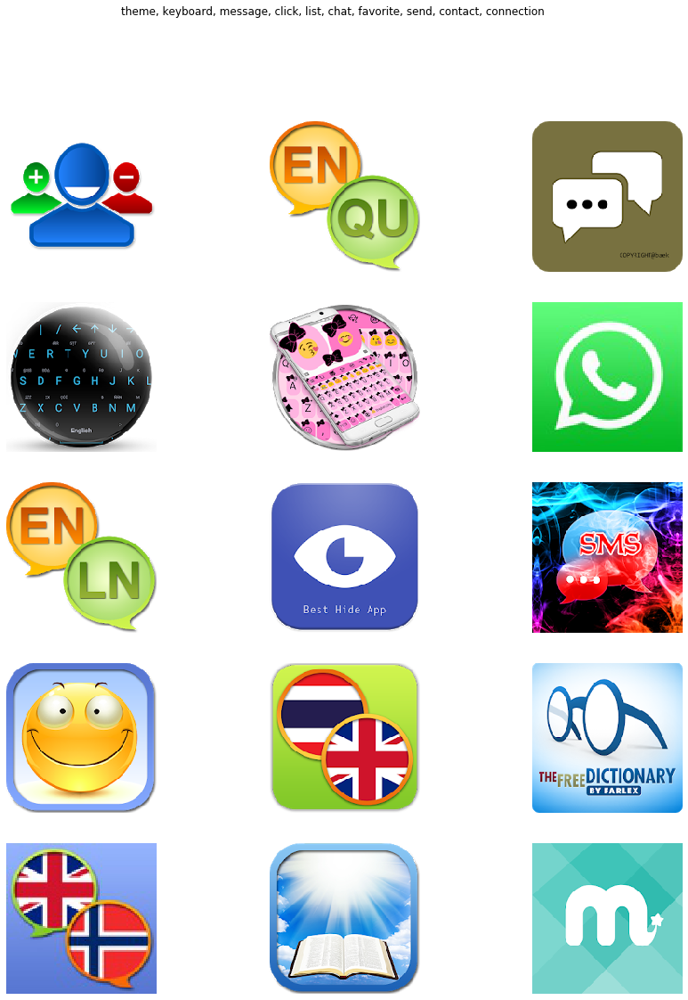

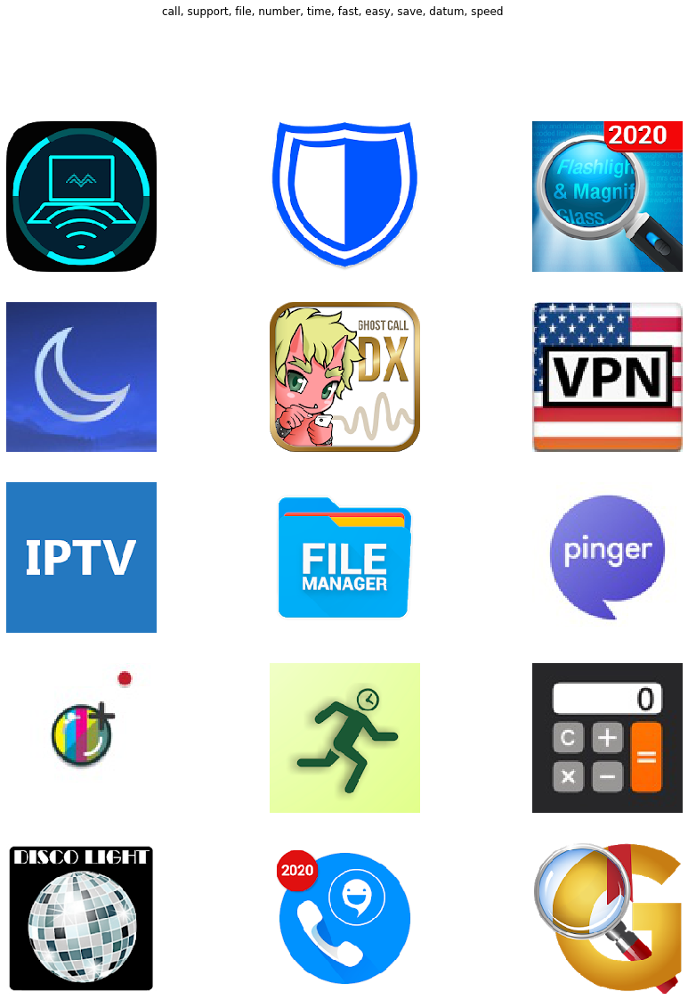

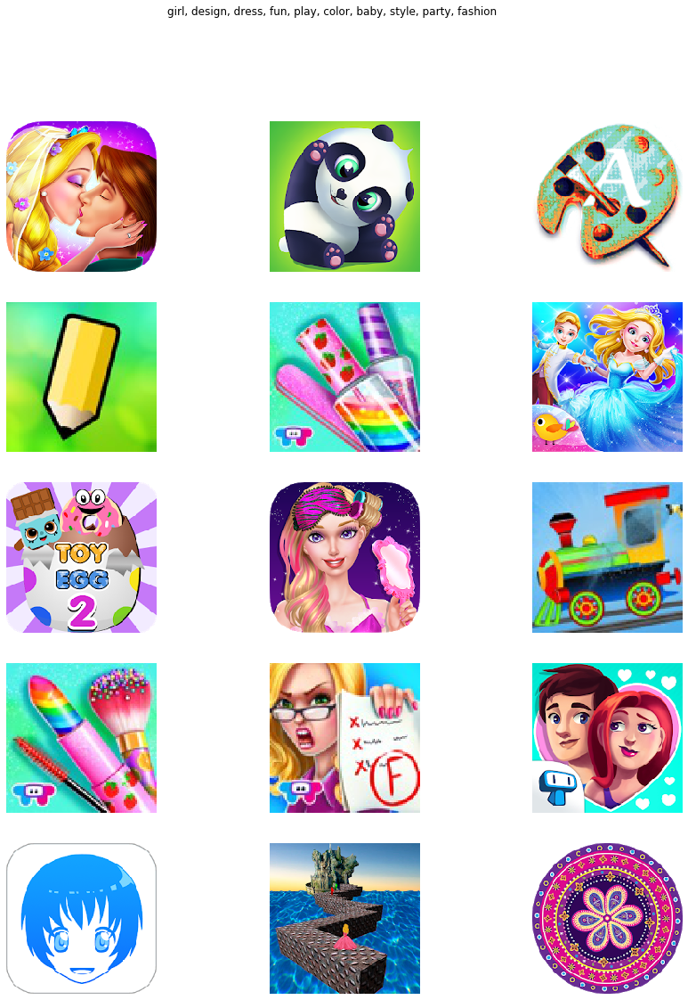

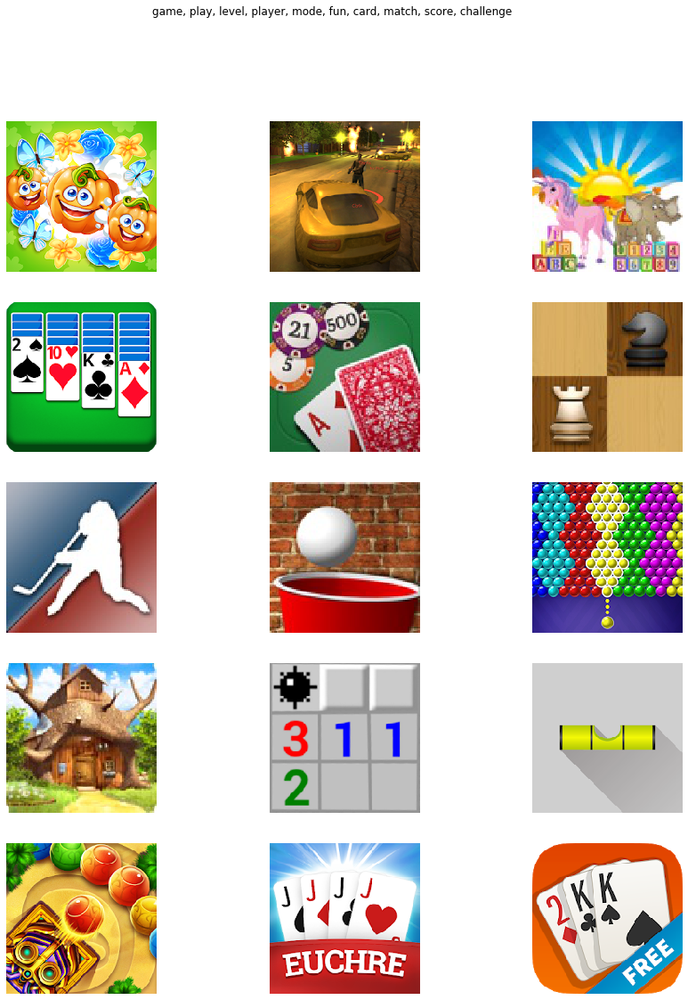

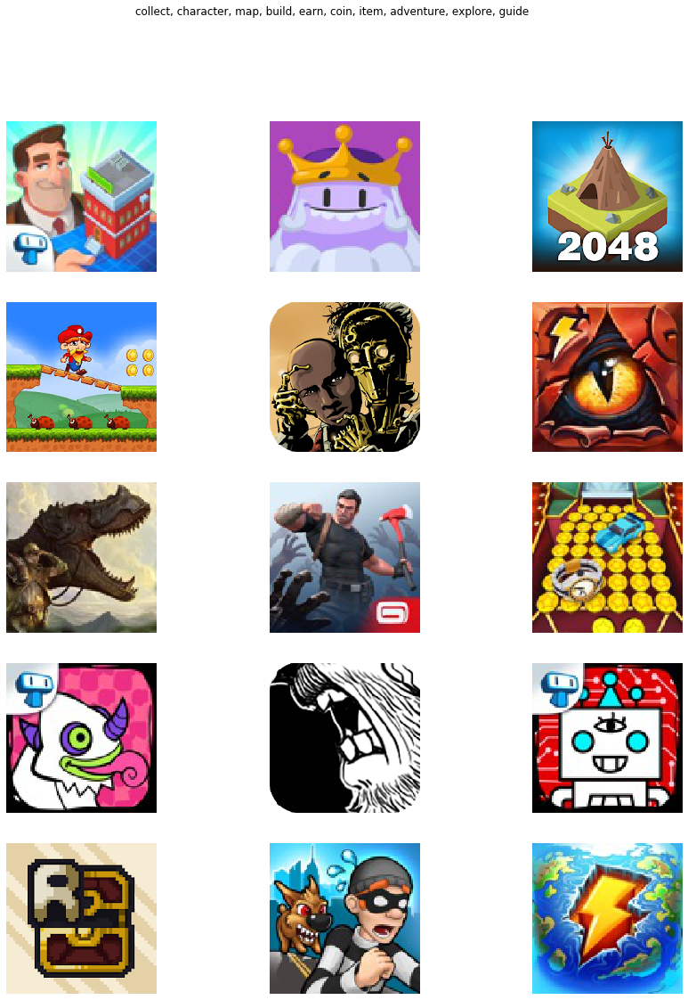

...

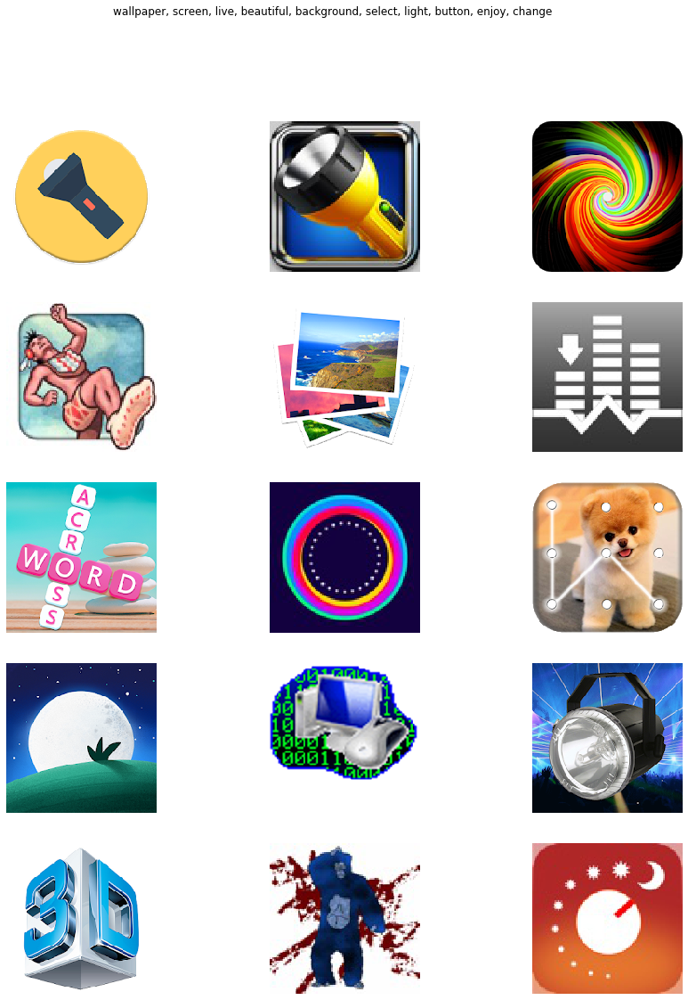

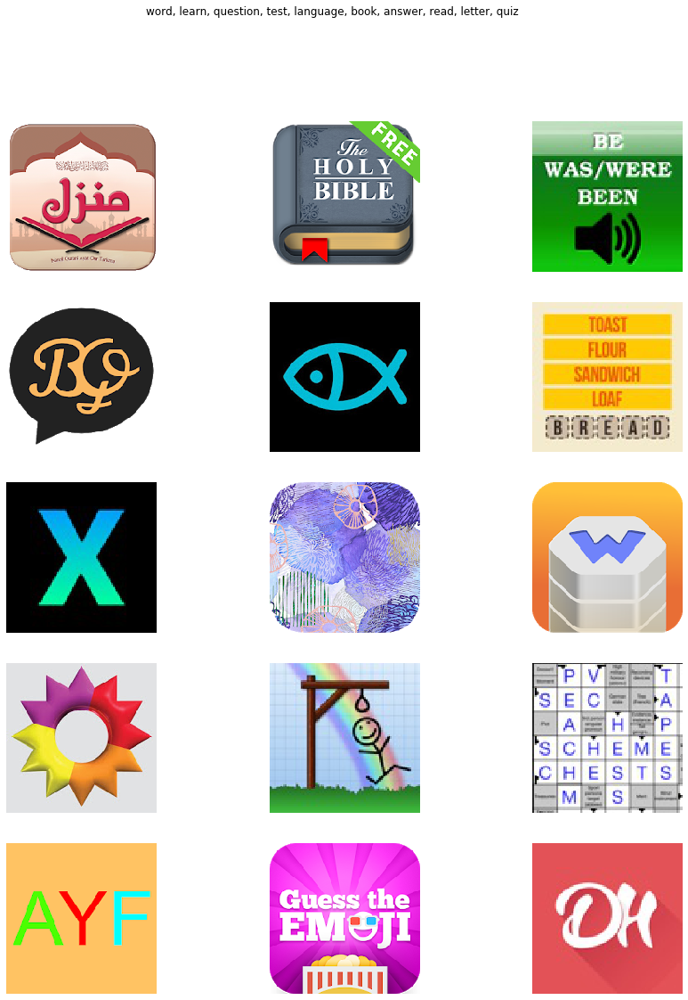

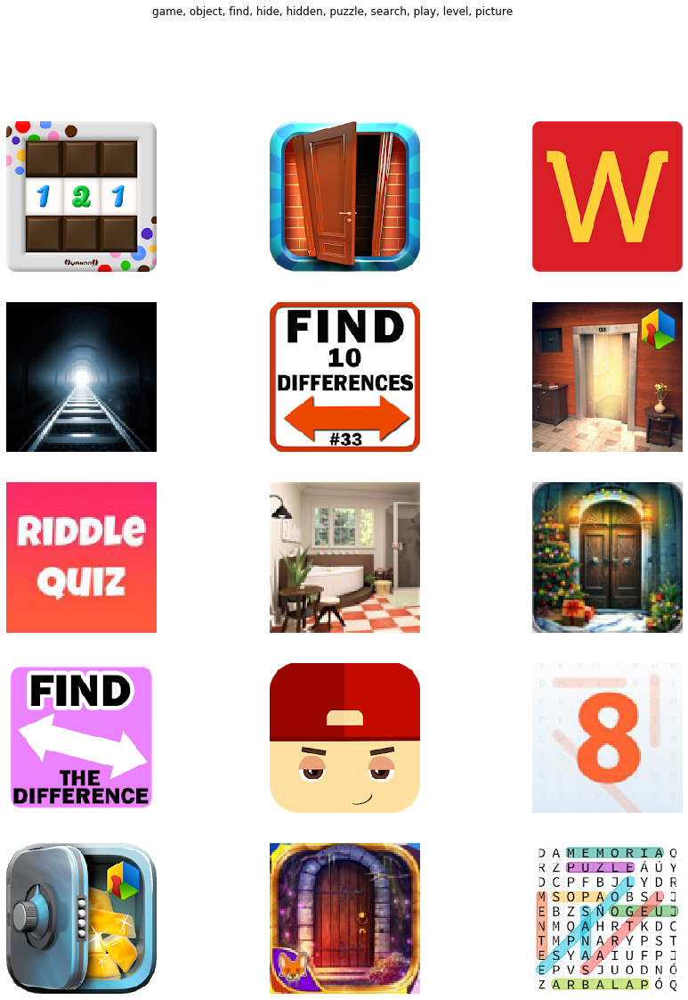

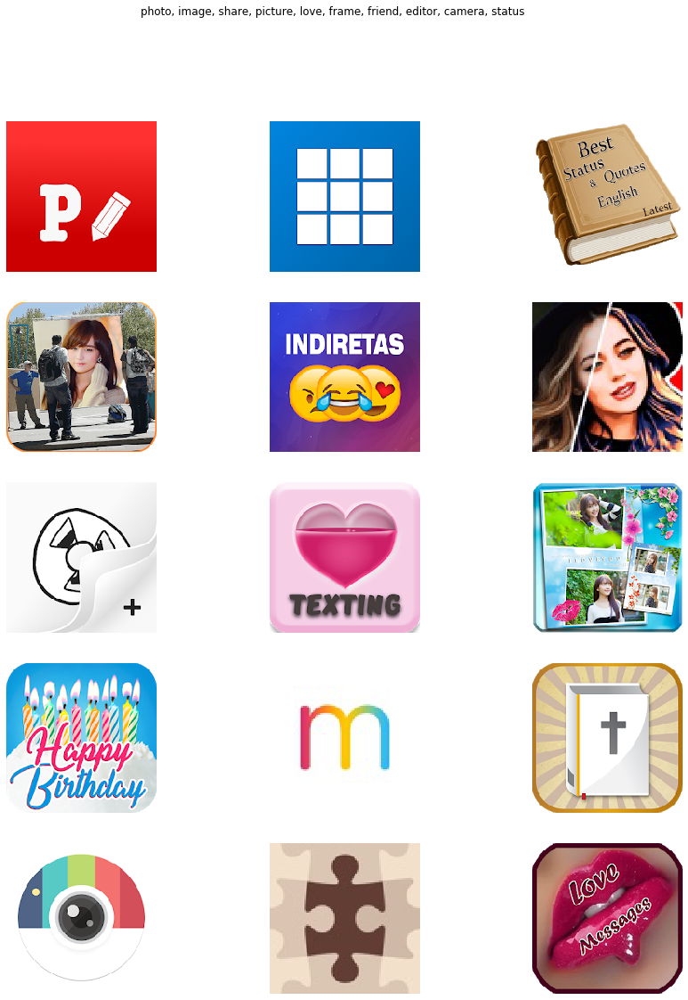

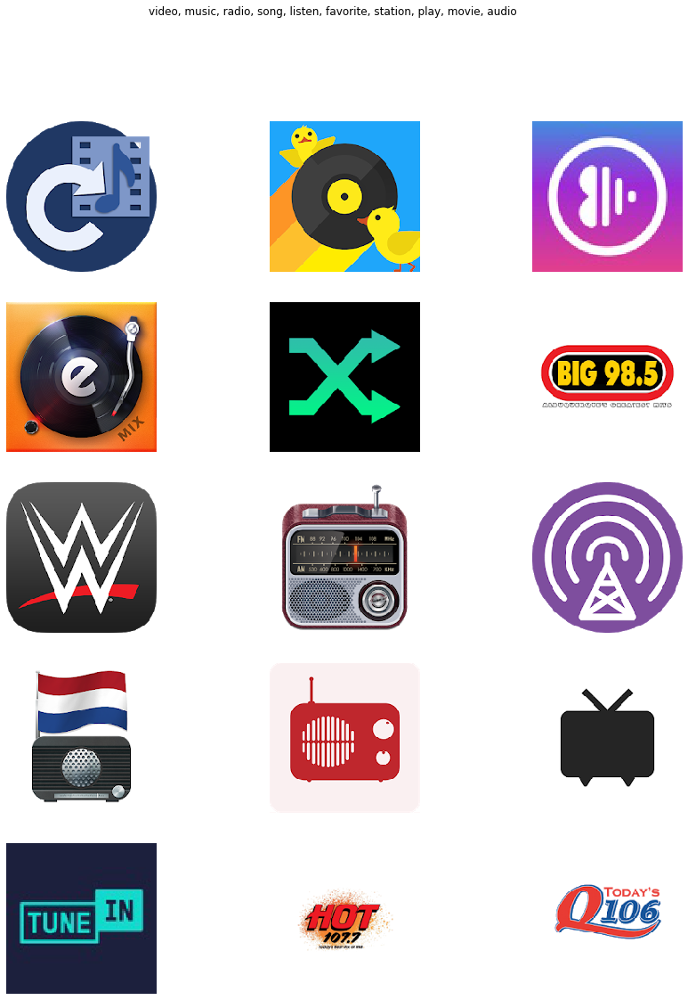

In [11]:
result[(~result.icon_url.isnull())].groupby("topic_num").apply(plot_images)